In [1]:
import pandas as pd

aligned_result_r5 = pd.read_csv('./round05_election_result_aligned.csv')
aligned_result_r5_df = pd.DataFrame(aligned_result_r5, columns=['광역시도', 'hannara_rate', 'minju_rate', 'gita_rate'])
aligned_result_r6 = pd.read_csv('./round06_election_result_aligned.csv')
aligned_result_r6_df = pd.DataFrame(aligned_result_r6, columns=['광역시도', 'minju_rate', 'saenuri_rate', 'gita_rate'])
aligned_result_r7 = pd.read_csv('./round07_election_result_aligned.csv')
aligned_result_r7_df = pd.DataFrame(aligned_result_r7, columns=['광역시도', 'minju_rate', 'hanguk_rate', 'gita_rate'])

print(aligned_result_r5_df, '\n')
print(aligned_result_r6_df, '\n')
print(aligned_result_r7_df)

       광역시도  hannara_rate  minju_rate  gita_rate
0       강원도      0.439666    0.523703   0.036631
1       경기도      0.500906    0.458654   0.040440
2      경상남도      0.455566    0.000000   0.544434
3      경상북도      0.724908    0.113714   0.161378
4     광주광역시      0.140573    0.560488   0.298939
5     대구광역시      0.714552    0.165296   0.120152
6     대전광역시      0.282589    0.230861   0.486550
7     부산광역시      0.546410    0.439369   0.014221
8     서울특별시      0.471315    0.465348   0.063337
9     울산광역시      0.604673    0.288760   0.106567
10    인천광역시      0.439410    0.521722   0.038868
11     전라남도      0.127720    0.651255   0.221025
12     전라북도      0.176454    0.665778   0.157768
13  제주특별자치도      0.000000    0.392471   0.607529
14     충청남도      0.171559    0.407255   0.421186
15     충청북도      0.450386    0.502465   0.047149 

       광역시도  minju_rate  saenuri_rate  gita_rate
0       강원도    0.488045      0.472511   0.039444
1       경기도    0.480870      0.490100   0.029030
2      경상남도    0.3

In [2]:
rnd_list = ['2010', '2014', '2018']
party_list = ['jinbo_1dang', 'bosu_1dang', 'gita_dang']
province_list = ['Gangwon', 'Gyeonggi', 'Gyeongnam', 'Gyeongbuk', 'Gwangju', 'Daegu',
           'Daejeon', 'Busan', 'Seoul', 'Sejong', 'Ulsan', 'Incheon', 'Jeonnam', 
            'Jeonbuk', 'Jeju', 'Chungnam', 'Chungbuk']

province_old_list = province_list.copy()
province_old_list.remove('Sejong')

final_row_list = []
for i in rnd_list:
    if(i == '2010'):
        p_list = province_old_list
    else:
        p_list = province_list

    for j in p_list:
        final_row_list.append(i + '_' + j)
  
# print(len(final_row_list))

arr_r5 = aligned_result_r5_df.values.copy()
arr_r5_list = []
for i in range(16):
        dang_list = [arr_r5[i][j] for j in range(4) if j%4 != 0]
        arr_r5_list.append(dang_list)
arr_r5_list_df = pd.DataFrame(arr_r5_list)
# print(arr_r5_list_df, '\n')

arr_r6 = aligned_result_r6_df.values.copy()
arr_r6_list = []
for i in range(17):
        dang_list = [arr_r6[i][j] for j in range(4) if j%4 != 0]
        arr_r6_list.append(dang_list)
arr_r6_list_df = pd.DataFrame(arr_r6_list)
# print(arr_r6_list_df, '\n')

arr_r7 = aligned_result_r7_df.values.copy()
arr_r7_list = []
for i in range(17):
        dang_list = [arr_r7[i][j] for j in range(4) if j%4 != 0]
        arr_r7_list.append(dang_list)
arr_r7_list_df = pd.DataFrame(arr_r7_list)
# print(arr_r7_list_df, '\n')

final_row_value_df = pd.concat([arr_r5_list_df, arr_r6_list_df, arr_r7_list_df])
final_row_value_df.index = final_row_list
final_row_value_df.columns = party_list
final_row_value_df

,jinbo_1dang,bosu_1dang,gita_dang
2010_Gangwon,0.439666,0.523703,0.036631
2010_Gyeonggi,0.500906,0.458654,0.040440
2010_Gyeongnam,0.455566,0.000000,0.544434
2010_Gyeongbuk,0.724908,0.113714,0.161378
2010_Gwangju,0.140573,0.560488,0.298939
2010_Daegu,0.714552,0.165296,0.120152
2010_Daejeon,0.282589,0.230861,0.486550
2010_Busan,0.546410,0.439369,0.014221
2010_Seoul,0.471315,0.465348,0.063337
2010_Ulsan,0.604673,0.288760,0.106567


In [3]:
import sys
import numpy as np

def KL(P,Q):
    epsilon = 1e-10

    # You may want to instead make copies to avoid changing the np arrays.
    P = P+epsilon
    Q = Q+epsilon

    divergence = np.sum(P*np.log(P/Q))
    return divergence

def KL_mean(P,Q):
    epsilon = 1e-10

    # You may want to instead make copies to avoid changing the np arrays.
    P = P+epsilon
    Q = Q+epsilon

    divergencePQ = np.sum(P*np.log(P/Q))
    divergenceQP = np.sum(Q*np.log(Q/P))
    return 0.5*(divergencePQ + divergenceQP)


data_values = final_row_value_df.values
# data_values

KL_result = []
for a in data_values:
    for b in data_values:
        KL_result.append(KL_mean(a,b))

# print(np.shape(KL_result))
KL_result_reshaped = np.reshape(KL_result, (50,50))
KL_result_df = pd.DataFrame(KL_result_reshaped)
KL_result_df.index = final_row_list
KL_result_df.columns = final_row_list
KL_result_df

,2010_Gangwon,2010_Gyeonggi,2010_Gyeongnam,2010_Gyeongbuk,2010_Gwangju,2010_Daegu,2010_Daejeon,2010_Busan,2010_Seoul,2010_Ulsan,...,2018_Busan,2018_Seoul,2018_Sejong,2018_Ulsan,2018_Incheon,2018_Jeonnam,2018_Jeonbuk,2018_Jeju,2018_Chungnam,2018_Chungbuk
2010_Gangwon,0.000000,0.008495,6.545505,0.476881,0.447112,0.323009,0.736496,0.029606,0.011859,0.133567,...,0.062845,0.328161,0.295324,0.046699,0.070790,0.892607,1.057084,1.430786,0.068347,0.133805
2010_Gyeonggi,0.008495,0.000000,5.759025,0.365612,0.497696,0.231043,0.695525,0.016093,0.006086,0.081110,...,0.031598,0.265917,0.208006,0.022862,0.034460,0.734355,0.889585,1.290405,0.028670,0.082078
2010_Gyeongnam,6.545505,5.759025,0.000000,1.481023,6.549381,2.133101,2.533230,5.852316,5.697284,3.523317,...,4.451984,2.609933,2.281537,4.775052,4.281605,0.575776,0.384037,0.319125,4.366134,3.533098
2010_Gyeongbuk,0.476881,0.365612,1.481023,0.000000,0.877977,0.015802,0.429249,0.424036,0.348180,0.103839,...,0.194844,0.093128,0.021839,0.231374,0.177214,0.053463,0.101989,0.416192,0.201727,0.104756
2010_Gwangju,0.447112,0.497696,6.549381,0.877977,0.000000,0.789382,0.241462,0.723786,0.391715,0.527869,...,0.441160,0.401249,0.757571,0.408773,0.486775,1.220853,1.245758,0.976265,0.621925,0.515266
2010_Daegu,0.323009,0.231043,2.133101,0.015802,0.789382,0.000000,0.467528,0.269550,0.224082,0.044426,...,0.107660,0.087077,0.000605,0.135701,0.092406,0.128719,0.201975,0.561592,0.103886,0.045958
2010_Daejeon,0.736496,0.695525,2.533230,0.429249,0.241462,0.467528,0.000000,0.988339,0.561893,0.417496,...,0.453568,0.154382,0.461538,0.460878,0.480896,0.500309,0.450483,0.221938,0.646743,0.405352
2010_Busan,0.029606,0.016093,5.852316,0.424036,0.723786,0.269550,0.988339,0.000000,0.042980,0.127553,...,0.075721,0.400465,0.246602,0.068539,0.071454,0.815807,1.009526,1.596027,0.037605,0.131395
2010_Seoul,0.011859,0.006086,5.697284,0.348180,0.391715,0.224082,0.561893,0.042980,0.000000,0.069993,...,0.021603,0.210071,0.201031,0.011972,0.028377,0.704378,0.840257,1.151302,0.038448,0.069432
2010_Ulsan,0.133567,0.081110,3.523317,0.103839,0.527869,0.044426,0.417496,0.127553,0.069993,0.000000,...,0.013898,0.071802,0.034690,0.024803,0.009821,0.315960,0.409428,0.722716,0.026408,0.000091


In [129]:
# import networkx as nx
# # import pygraphviz
# import matplotlib.pyplot as plt

# G = nx.Graph()
# G.add_nodes_from(final_row_list)
# for r in KL_result_df.index:
#     for c in KL_result_df.columns:
#         G.add_edge(r, c)

# pr = nx.pagerank(G)
# nsize = np.array([v for v in pr.values()])
# nsize = 2000*(nsize - min(nsize)) / (max(nsize) - min(nsize))

# pos = nx.spring_layout(G)

# plt.figure(figsize=(20,20))
# plt.axis('off')
# nx.draw_networkx(G, font_family='KoPbDotum', font_size=16,
#                 pos=pos, node_color=list(pr.values()), node_size=nsize,
#                 alpha=0.7, edge_color='.5', cmap=plt.cm.YlGn)

In [130]:
# !pip install networkx
# !pip install pygraphviz
# !pip install plotly

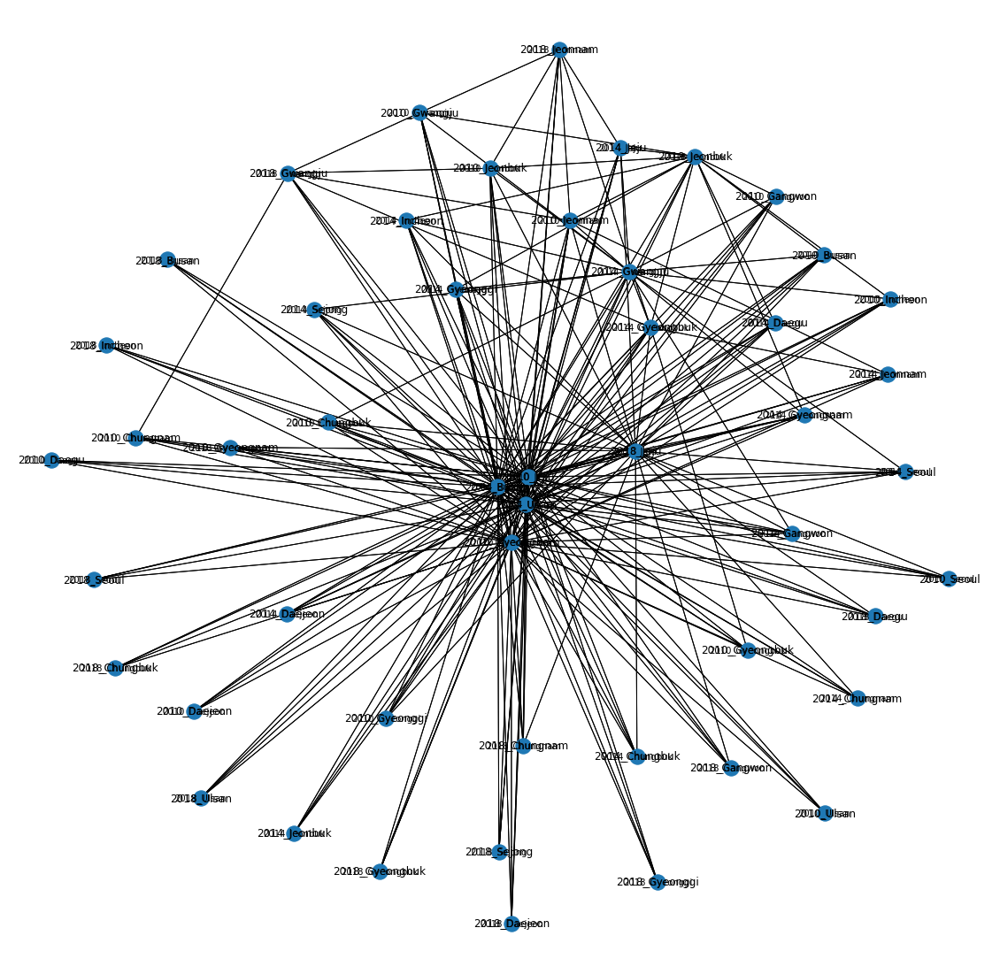

In [131]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph()
G.add_nodes_from(final_row_list)
# weight_list = []
for r in KL_result_df.index:
    for c in KL_result_df.columns:
        if KL_result_df[r][c] > 1:
            G.add_edge(r, c, len=KL_result_df[r][c])
#             weight_list.append(KL_result_df[r][c])
            
# for w in weight_list:
#     print(w.values())
pos = nx.spring_layout(G)
plt.figure(figsize=(20, 20))
# print(node_size)

nx.draw_networkx_nodes(G,pos,node_size=5)
nx.draw_networkx_edges(G,pos,width=1, weight=True)
# cnt = 0

# for r in KL_result_df.index:
#     for c in KL_result_df.columns:
#         draw_edges.set_alpha(weight_list[cnt]/100)
        
nx.draw_networkx_labels(G,pos,font_size=10)
nx.draw(G, pos, with_labels=True)
plt.show()

In [132]:
KL_result_df.to_csv('./KL_mean_result_df.csv', encoding='utf-8',  sep=',')

In [11]:
index_list = list(KL_result_df.index)

index_list_2010 = []
index_list_2014 = []
index_list_2018 = []
for index in index_list:
    if '2010' in index:
        index_list_2010.append(index)
    elif '2014' in index:
        index_list_2014.append(index)
    elif '2018' in index:
        index_list_2018.append(index)

KL_result_df_2010 = pd.DataFrame(KL_result_df,
                                 index=index_list_2010,
                                columns=index_list_2010)

KL_result_df_2014 = pd.DataFrame(KL_result_df,
                                 index=index_list_2014,
                                columns=index_list_2014)

KL_result_df_2018 = pd.DataFrame(KL_result_df,
                                 index=index_list_2018,
                                columns=index_list_2018)

In [137]:
KL_result_df_2010.to_csv('./KL_result_df_2010.csv', encoding='utf-8',  sep=',')
KL_result_df_2014.to_csv('./KL_result_df_2014.csv', encoding='utf-8',  sep=',')
KL_result_df_2018.to_csv('./KL_result_df_2018.csv', encoding='utf-8',  sep=',')

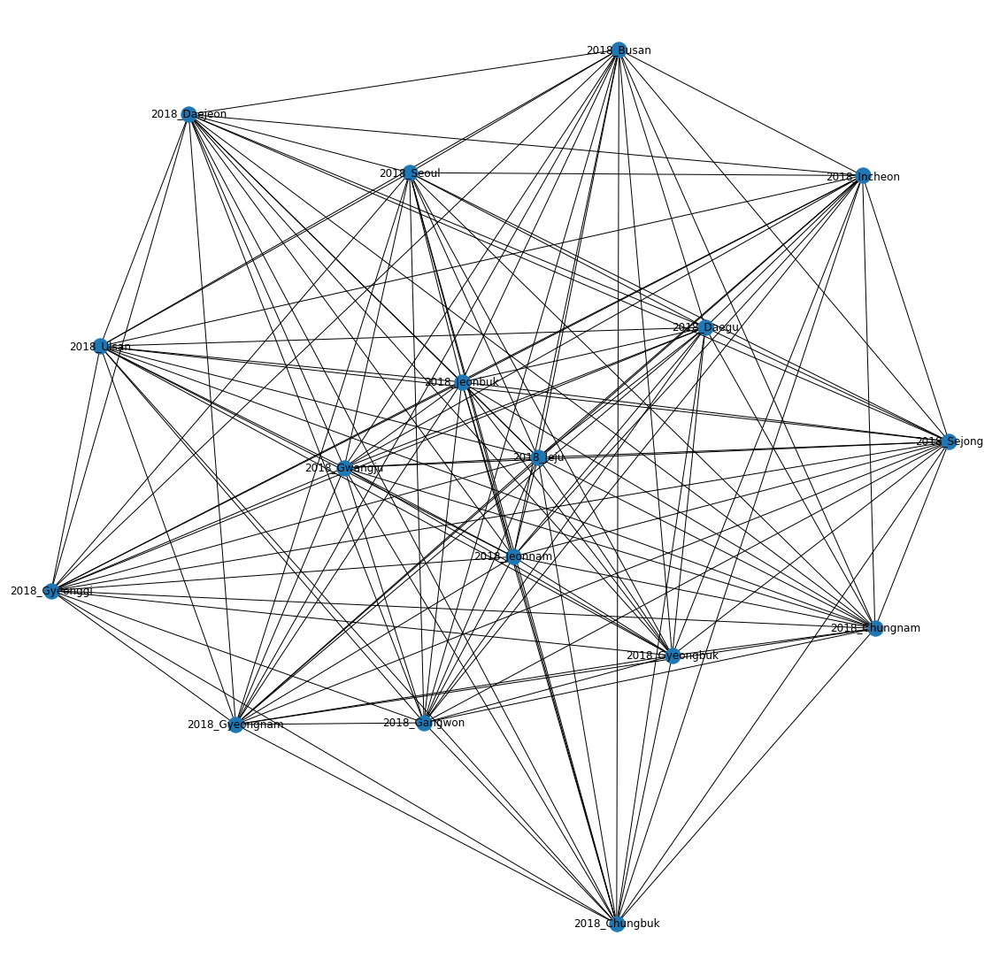

In [47]:
import networkx as nx
# import pygraphviz
import matplotlib.pyplot as plt

G = nx.Graph()
G.add_nodes_from(KL_result_df_2018)
for r in KL_result_df_2018.index:
    for c in KL_result_df_2018.columns:
        if(KL_result_df_2018[r][c] > 0):
            G.add_edge(r, c, weight=KL_result_df_2018[r][c], length=KL_result_df_2018[r][c])

plt.figure(figsize=(20,20))
plt.axis('off')
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
plt.show()

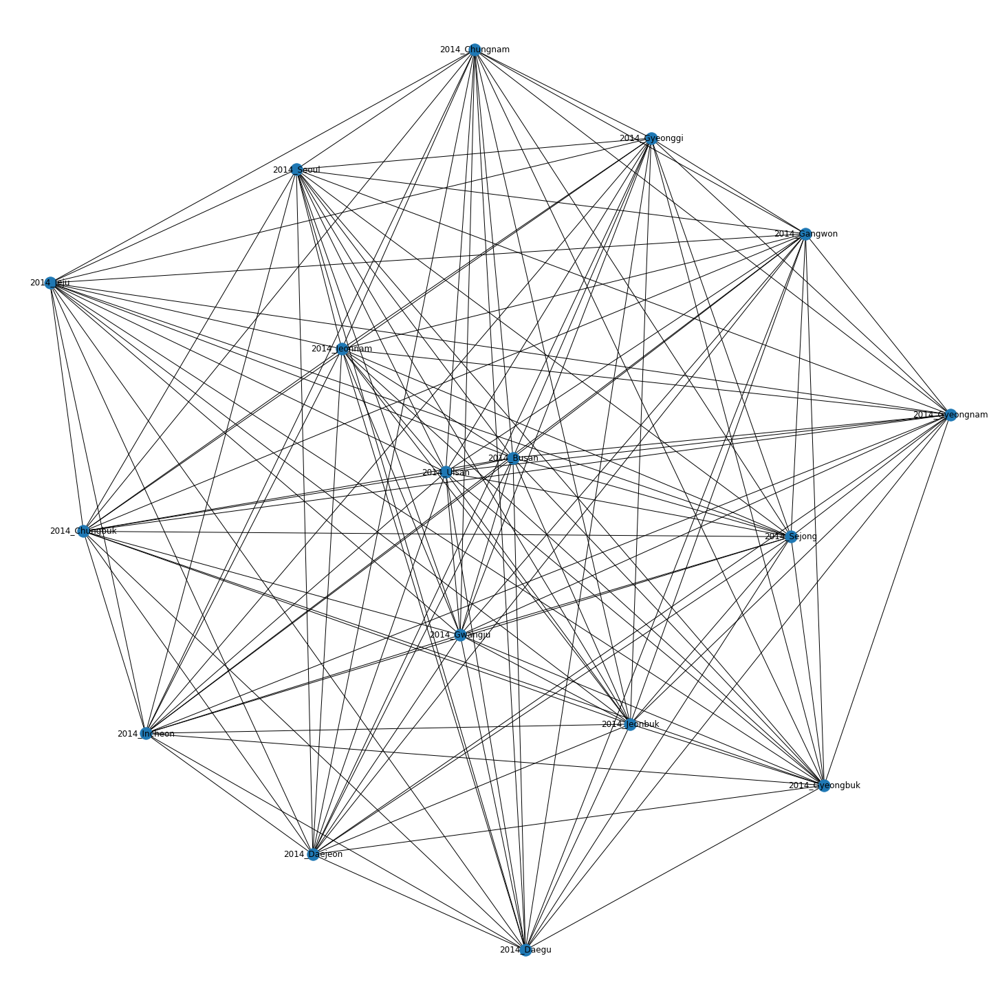

In [48]:
import networkx as nx
# import pygraphviz
import matplotlib.pyplot as plt

G = nx.Graph()
G.add_nodes_from(KL_result_df_2014)
for r in KL_result_df_2014.index:
    for c in KL_result_df_2014.columns:
        if(KL_result_df_2014[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df_2014[r][c], length=KL_result_df_2014[r][c])

plt.figure(figsize=(20,20))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
plt.show()

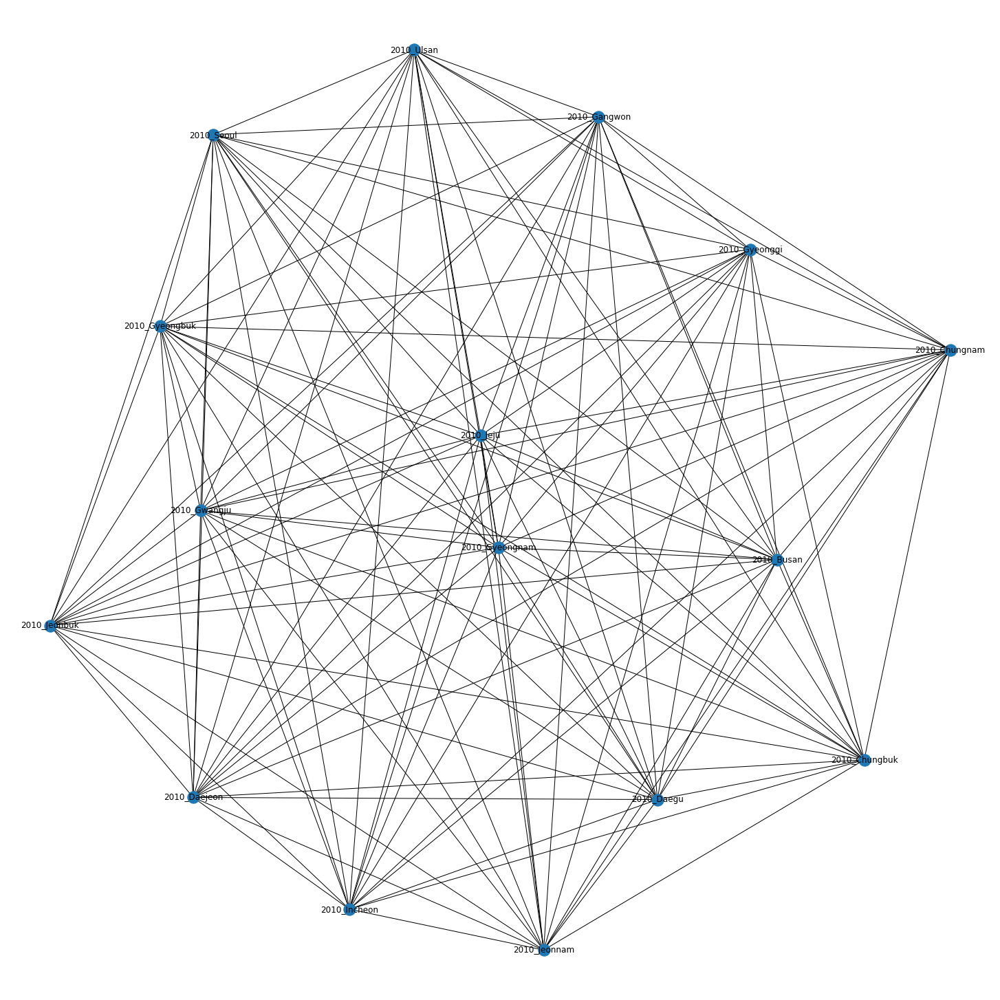

In [50]:
import networkx as nx
# import pygraphviz
import matplotlib.pyplot as plt

G = nx.Graph()
G.add_nodes_from(KL_result_df_2010)
for r in KL_result_df_2010.index:
    for c in KL_result_df_2010.columns:
        if(KL_result_df_2010[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df_2010[r][c], length=KL_result_df_2010[r][c])

plt.figure(figsize=(20,20))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
plt.show()

[1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1]


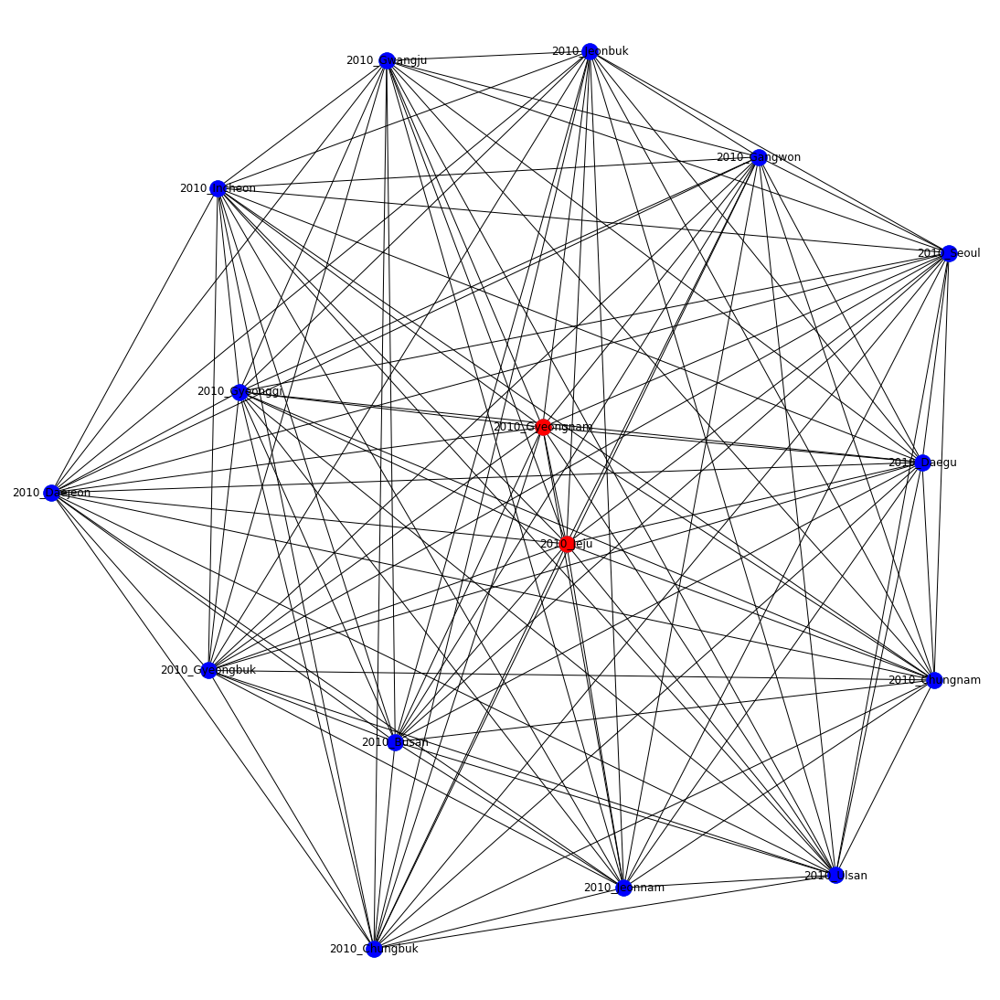

In [102]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=2)
model.fit(KL_result_df_2010)
print(model.labels_)

G = nx.Graph()
G.add_nodes_from(KL_result_df_2010)
for r in KL_result_df_2010.index:
    for c in KL_result_df_2010.columns:
        if(KL_result_df_2010[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df_2010[r][c], length=KL_result_df_2010[r][c])

plt.figure(figsize=(15,15))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)


blue_list = []
red_list = []
for idx, flag in enumerate(list(model.labels_)):
#     print(idx, flag)
    if flag == 1:
        blue_list.append(KL_result_df_2010.index[idx])
    else:
        red_list.append(KL_result_df_2010.index[idx])

nx.draw_networkx_nodes(G, pos, nodelist=blue_list, node_color='b')
nx.draw_networkx_nodes(G, pos, nodelist=red_list, node_color='r')
plt.show()

[0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0]


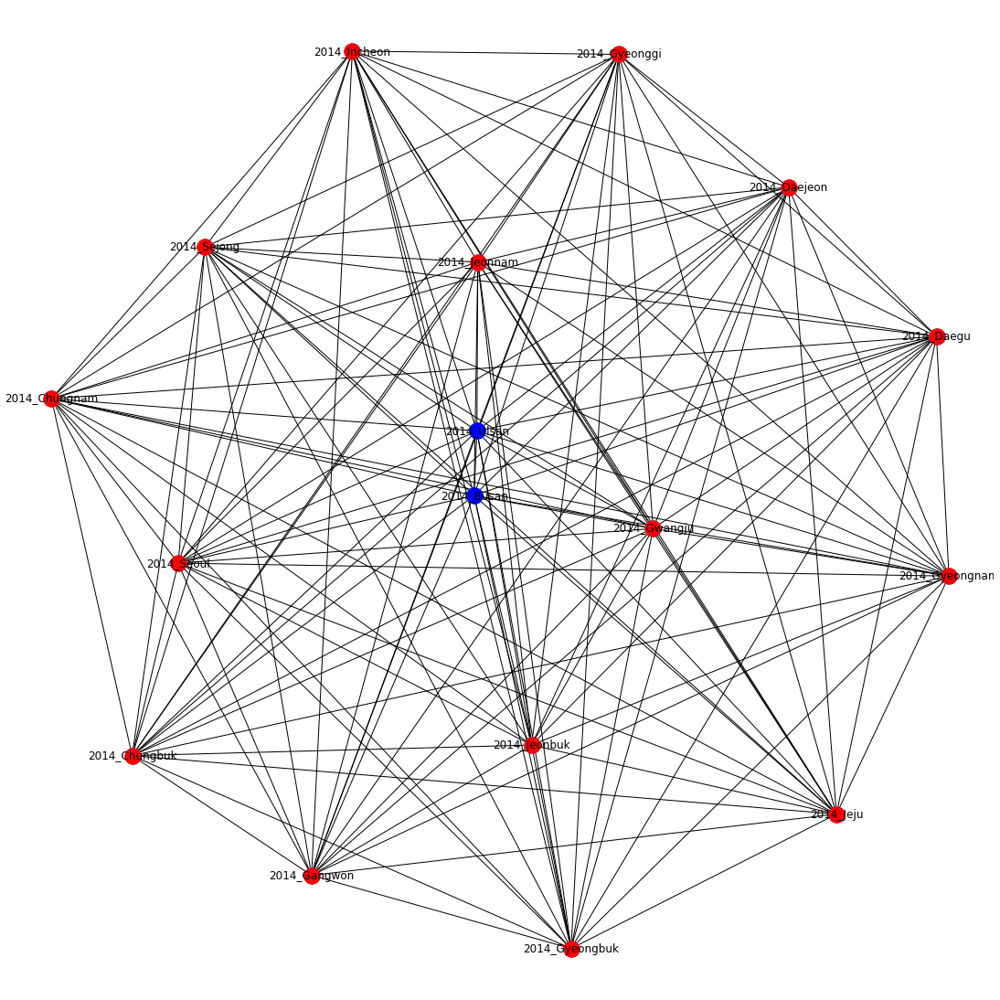

In [103]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=2)
model.fit(KL_result_df_2014)
print(model.labels_)

G = nx.Graph()
G.add_nodes_from(KL_result_df_2014)
for r in KL_result_df_2014.index:
    for c in KL_result_df_2014.columns:
        if(KL_result_df_2014[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df_2014[r][c], length=KL_result_df_2014[r][c])

plt.figure(figsize=(15,15))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)


blue_list = []
red_list = []
for idx, flag in enumerate(list(model.labels_)):
#     print(idx, flag)
    if flag == 1:
        blue_list.append(KL_result_df_2014.index[idx])
    else:
        red_list.append(KL_result_df_2014.index[idx])

nx.draw_networkx_nodes(G, pos, nodelist=blue_list, node_color='b')
nx.draw_networkx_nodes(G, pos, nodelist=red_list, node_color='r')
plt.show()

[0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0]


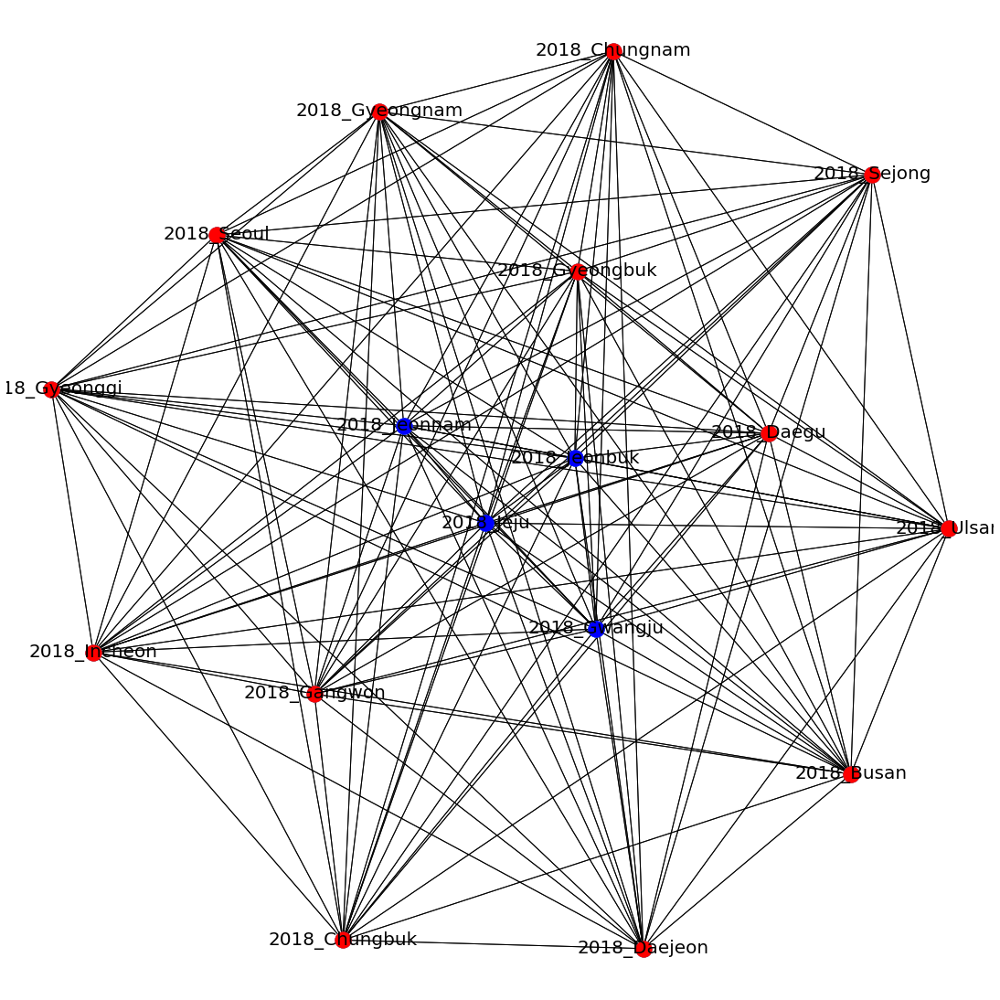

In [108]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=2)
model.fit(KL_result_df_2018)
print(model.labels_)

G = nx.Graph()
G.add_nodes_from(KL_result_df_2018)
edge_list = []
for r in KL_result_df_2018.index:
    for c in KL_result_df_2018.columns:
        if(KL_result_df_2018[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df_2018[r][c], length=KL_result_df_2018[r][c], alpha=0.5)
            edge_list.append((r, c))

plt.figure(figsize=(15,15))
pos = nx.spring_layout(G)
nx.draw(G, pos)


blue_list = []
red_list = []
for idx, flag in enumerate(list(model.labels_)):
#     print(idx, flag)
    if flag == 1:
        blue_list.append(KL_result_df_2018.index[idx])
    else:
        red_list.append(KL_result_df_2018.index[idx])

# print(edge_list)
nx.draw_networkx_nodes(G, pos, nodelist=blue_list, node_color='b')
nx.draw_networkx_nodes(G, pos, nodelist=red_list, node_color='r')
nx.draw_networkx_edges(G, pos, edgelist=edge_list, alpha=0.5)
nx.draw_networkx_labels(G,pos,font_size=20)
plt.show()

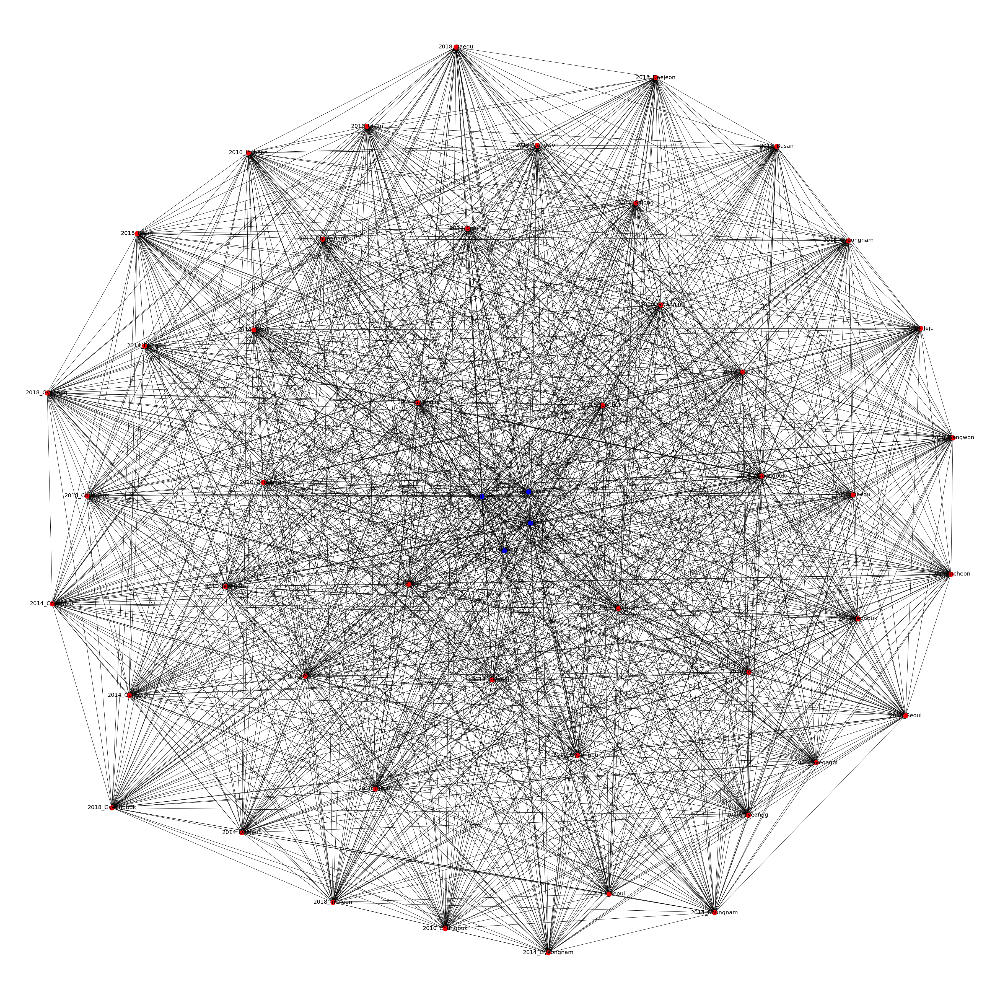

In [109]:
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

model = KMeans(n_clusters=2)
model.fit(KL_result_df)
# print(model.labels_)
# print(L2norm_result_df.index)

G = nx.Graph()
G.add_nodes_from(KL_result_df)
edge_list = []
for r in KL_result_df.index:
    for c in KL_result_df.columns:
        if(KL_result_df[r][c] > 0.):
            G.add_edge(r, c, weight=KL_result_df[r][c], length=KL_result_df[r][c], alpha=0.5)
            edge_list.append((r, c))

plt.figure(figsize=(50,50))
pos = nx.spring_layout(G)
nx.draw(G, pos)


blue_list = []
red_list = []
for idx, flag in enumerate(list(model.labels_)):
#     print(idx, flag)
    if flag == 1:
        blue_list.append(KL_result_df.index[idx])
    else:
        red_list.append(KL_result_df.index[idx])

# print(edge_list)
nx.draw_networkx_nodes(G, pos, nodelist=blue_list, node_color='b')
nx.draw_networkx_nodes(G, pos, nodelist=red_list, node_color='r')
nx.draw_networkx_edges(G, pos, edgelist=edge_list, alpha=0.1)
nx.draw_networkx_labels(G,pos,font_size=20)
plt.show()